#  1. Introduction
=================================================

Graded Challange 7

Nama : Sesilia Virdha Kezia

Batch : HCK-027

Tujuan dari proyek ini adalah untuk membangun sebuah model Computer Vision berbasis Deep Learning yang mampu melakukan klasifikasi gambar wajah berdasarkan lima jenis penyakit kulit, yaitu: Acne, Eczema, Basal Cell Carcinoma, Rosacea, dan Actinic Keratosis.

dataset = https://www.kaggle.com/datasets/amellia/face-skin-disease

deployment = https://huggingface.co/spaces/sesiliavk/cv_gc7

=================================================

### Latar Belakang
Penyakit kulit merupakan salah satu masalah kesehatan yang umum terjadi di berbagai lapisan masyarakat. Beberapa jenis penyakit kulit seperti Acne, Eczema, Basal Cell Carcinoma, Rosacea, dan Actinic Keratosis dapat memengaruhi kualitas hidup seseorang, baik dari segi kesehatan maupun aspek psikososial. Deteksi dini dan klasifikasi yang akurat terhadap penyakit kulit sangat penting untuk memastikan penanganan yang tepat dan efektif.

Namun, akses terhadap dokter spesialis kulit yang berpengalaman tidak selalu mudah dan merata, terutama di daerah terpencil atau bagi mereka yang memiliki keterbatasan waktu dan biaya. Oleh karena itu, teknologi berbasis kecerdasan buatan, khususnya computer vision dan deep learning, dapat menjadi solusi inovatif untuk membantu diagnosis dini dan mandiri.

### Tujuan
Proyek ini bertujuan untuk membangun sebuah model computer vision berbasis deep learning yang dapat digunakan untuk mengklasifikasikan gambar wajah berdasarkan lima jenis penyakit kulit seperti Acne, Eczema, Basal Cell Carcinoma, Rosacea, dan Actinic Keratosis. Dengan model ini, diharapkan masyarakat dapat melakukan pemeriksaan awal secara mandiri, sehingga mempercepat proses identifikasi penyakit dan mendukung langkah medis lebih lanjut.

# 2. Import Libraries

In [ ]:
# Import libraries

import os
import cv2
import glob
import random
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow.keras import regularizers
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, Dropout, Conv2D, MaxPooling2D, Flatten, Input, GlobalAveragePooling2D
from tensorflow.keras.applications import EfficientNetB0, DenseNet121, Xception
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

from sklearn.metrics import confusion_matrix, classification_report
import warnings
warnings.filterwarnings('ignore')
import collections

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


#  3. Data Loading
Memuat data yang akan diolah dalam deep learning dengan menentukan lokasi (path) folder dataset yang ada  di google drive yang akan digunakan dalam deep learning

In [5]:
# Define path
train_path = '/content/drive/MyDrive/DATA/train'
test_path = '/content/drive/MyDrive/DATA/testing'

In [6]:
# Check how many data in `train_path` and `test_path`
def check_path(path):
  labels = os.listdir(path)
  for label in labels:
    num_data = len(os.listdir(os.path.join(path, label)))
    print(f'Total Data - {label} : {num_data}')

print('Train Path')
check_path(train_path)
print('')

print('Test Path')
check_path(test_path)
print('')

Train Path
Total Data - Actinic Keratosis : 88
Total Data - Basal Cell Carcinoma : 88
Total Data - Rosacea : 88
Total Data - Eczemaa : 88
Total Data - Acne : 88

Test Path
Total Data - Actinic Keratosis : 37
Total Data - Eczemaa : 37
Total Data - Acne : 37
Total Data - Basal Cell Carcinoma : 37
Total Data - Rosacea : 37



Dari hasil diatas, terdapat 2 folder yaitu Train dan Test dimana tiap folder terdapat 5 kelas yaitu Acne, Eczema, Basal Cell Carcinoma, Rocasea, dan Actinic Keratosis. Jumlah gambar tiap kelas sama yaitu  di folder  train terdapat 88 gambar tiap kelas dan terdapat 37 gambar yang ada di folder test.

# 4. Exploratory Data Analysis (EDA)
untuk memahami karakteristik data gambar sebelum melatih model. EDA membantu mengenali potensi masalah dan menyiapkan strategi yang tepat untuk preprocessing dan pelatihan model.

Function dibawah ini digunakan untuk menampilkan sampel gambar dari tiap kelas
Untuk memastikan gambar sudah sesuai dengan label dan memahami variasi visual dari masing-masing penyakit.

In [7]:
def plot_images(path):
  labels = os.listdir(path)
  for label in labels:
    folder_path = os.path.join(path, label)
    fig = plt.figure(figsize=(20, 20))
    columns = 5
    rows = 1
    print('Class : ', label)
    images = os.listdir(folder_path)
    for index in range(1, columns*rows +1):
        fig.add_subplot(rows, columns, index)
        image = plt.imread(os.path.join(folder_path, images[index]))
        plt.imshow(image)
        plt.axis("off")
    plt.show()

Class :  Actinic Keratosis


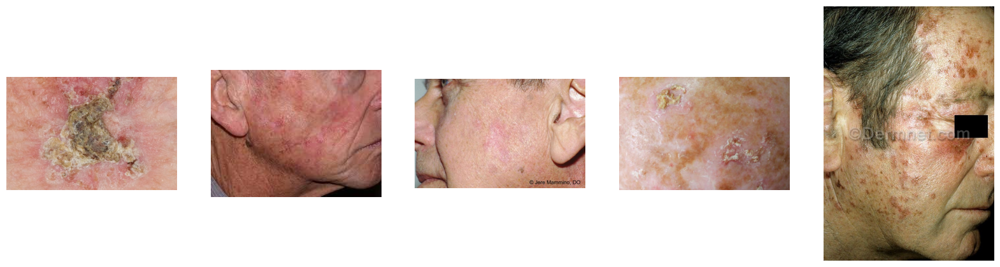

Class :  Basal Cell Carcinoma


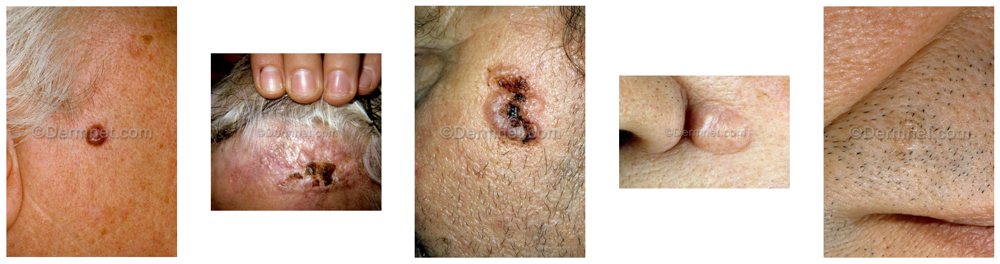

Class :  Rosacea


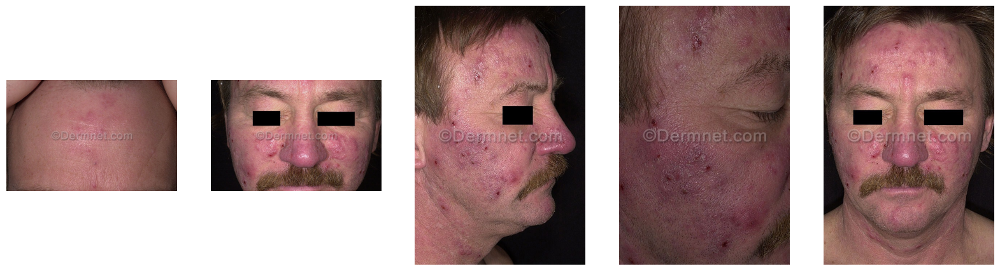

Class :  Eczemaa


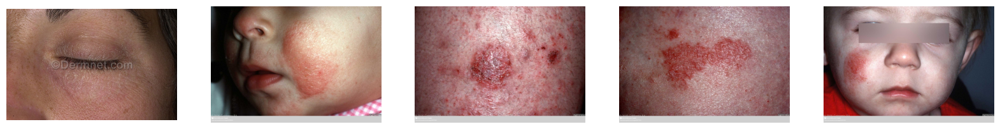

Class :  Acne


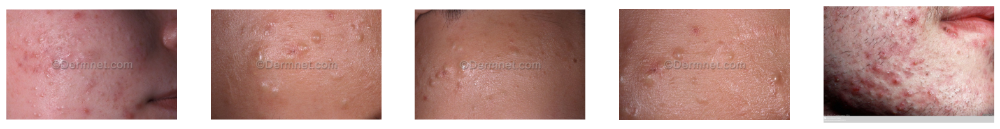

In [8]:
plot_images(train_path)

Class :  Actinic Keratosis


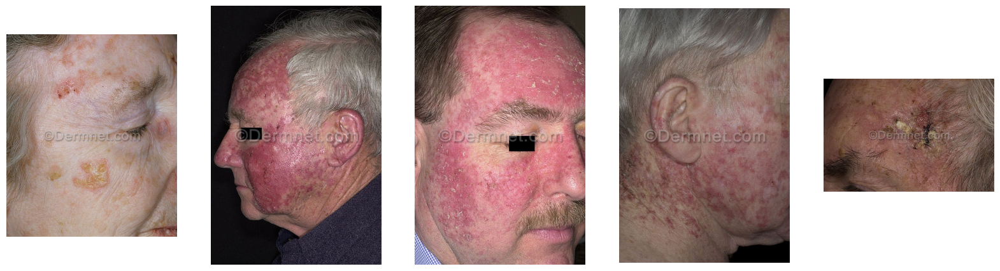

Class :  Eczemaa


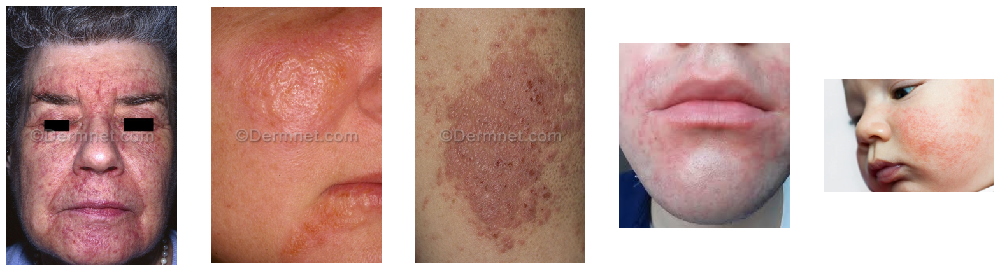

Class :  Acne


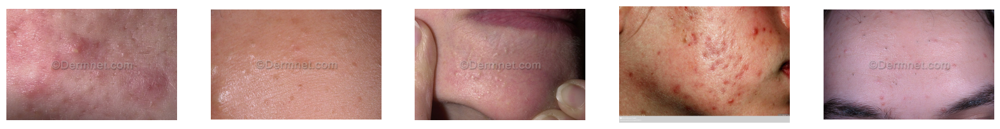

Class :  Basal Cell Carcinoma


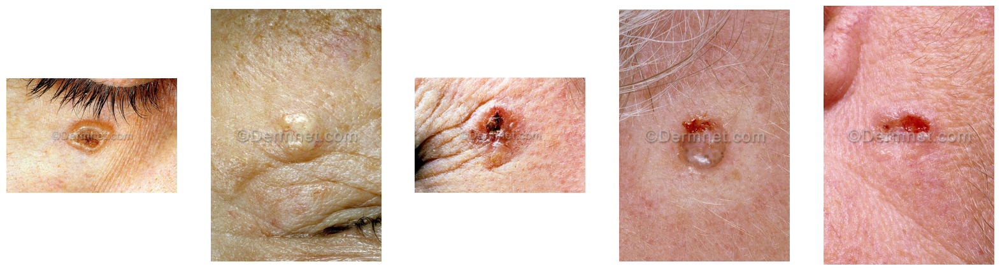

Class :  Rosacea


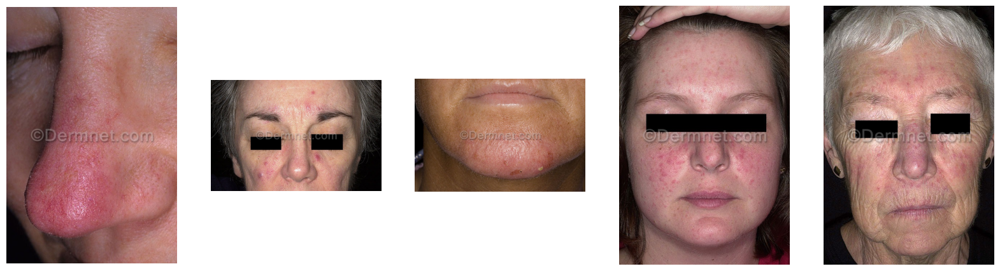

In [9]:
plot_images(test_path)

Penjelasan 5 penyakit diatas:
1. Acne (jerawat):
kondisi kulit kronis yang terjadi akibat penyumbatan dan peradangan pada folikel rambut oleh sebum (minyak kulit) dan sel kulit mati.

  ciri-ciri:
  * Komedo terbuka (blackheads) dan tertutup (whiteheads)
  * Papula (benjolan merah kecil tanpa nanah)
  * Pustula (benjolan dengan nanah)
  * Nodul dan kista (lebih dalam dan menyakitkan)

2. Eczema:
Eczema adalah kondisi inflamasi kronis pada kulit yang menyebabkan rasa gatal, kemerahan, dan kering. Bersifat kambuhan dan sering terjadi pada anak-anak, namun juga bisa menyerang orang dewasa.

  ciri-ciri:
  * Kulit kering, tebal, dan bersisik
  * Kemerahan dan bengkak
  * Ruam gatal, bisa berisi cairan
  * Luka lecet akibat garukan

3. Basal Cell Carcinoma:
Merupakan bentuk paling umum dari kanker kulit yang berasal dari sel basal di lapisan terdalam epidermis. Biasanya disebabkan oleh paparan sinar ultraviolet (UV) dalam jangka panjang. Meski jarang menyebar ke bagian tubuh lain, kondisi ini bisa merusak jaringan di sekitarnya jika tidak ditangan.

  ciri-ciri:
  * Benjolan kecil, seperti mutiara, warna daging atau merah muda
  * Luka terbuka yang tidak sembuh-sembuh
  * Permukaan mengilap atau seperti lilin
  * Kadang berdarah atau bersisik

4. Rosacea:
Kondisi peradangan kulit jangka panjang yang menyebabkan kulit memerah dan ruam, terutama di wajah.

  ciri-ciri:
  * Kemerahan persisten di tengah wajah
  * Pembuluh darah kecil terlihat (telangiektasia)
  * Benjolan atau jerawat mirip acne (tanpa komedo)
  * Sensasi panas atau terbakar
  * Kadang pembengkakan pada hidung (rhinophyma)

5. Actinic Keratosis:
Actinic keratosis adalah lesi kulit prakanker yang disebabkan oleh kerusakan akibat sinar matahari. Dapat berkembang menjadi karsinoma sel skuamosa bila tidak ditangani.

  ciri-ciri:
  * Bercak kasar, bersisik, seperti amplas
  * Warna merah muda, merah, kuning, atau cokelat
  * Kulit tampak menebal di area kecil
  * Bisa terasa gatal atau menyakitkan







Function dibawah ini digunakan untuk melihat distribusi tiap kelas untuk menngetahui apakah dataset seimbang atau tidak sesuai jumlah setiap kelasnya

In [10]:
def plot_class_distribution(path):
    labels = [label for label in os.listdir(path) if os.path.isdir(os.path.join(path, label))]
    counts = []

    for label in labels:
        folder_path = os.path.join(path, label)
        images = [img for img in os.listdir(folder_path) if img.lower().endswith(('.jpg', '.jpeg', '.png'))]
        counts.append(len(images))

    # Plot bar chart
    plt.figure(figsize=(10,6))
    plt.bar(labels, counts, color='skyblue')
    plt.title('Jumlah Gambar per Kelas')
    plt.xlabel('Kelas')
    plt.ylabel('Jumlah Gambar')
    plt.xticks(rotation=45)
    plt.show()

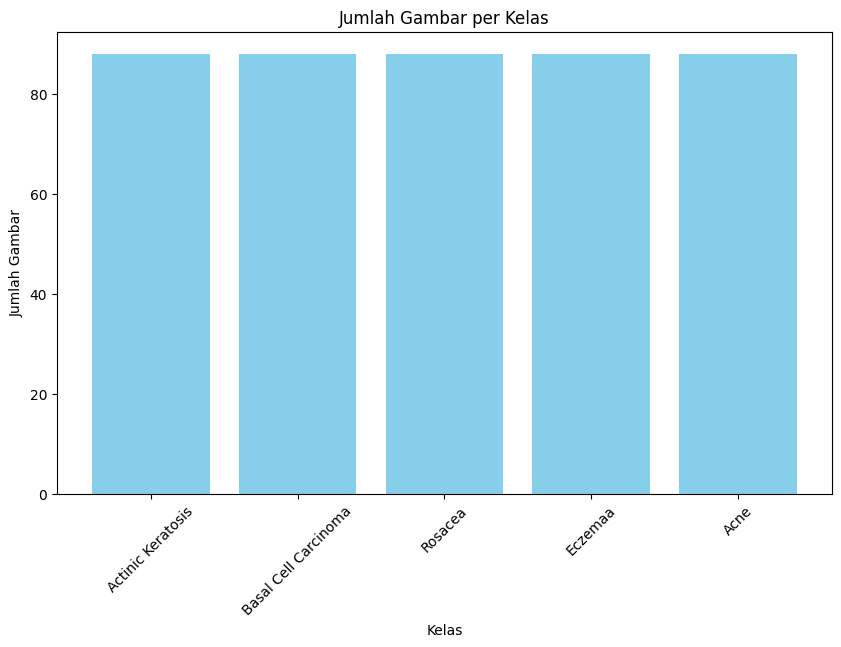

In [11]:
plot_class_distribution(train_path)

dari gambar visualisasi distribusi  tiap  kelas yang ada di Train, dapat dilihat bahwa dataset sudah balance dengan jumlah data 85 tiap kelas

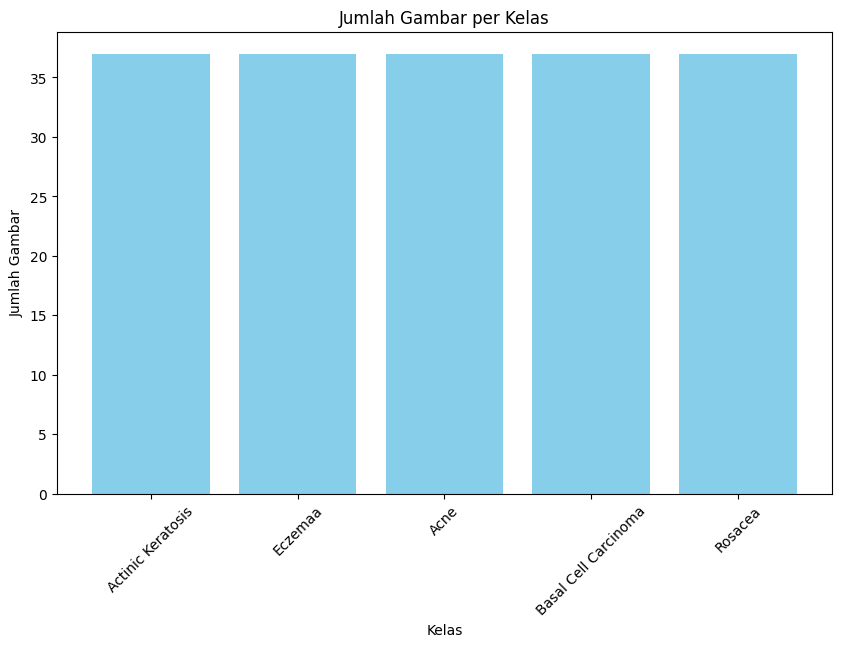

In [12]:
plot_class_distribution(test_path)

dari gambar visualisasi distribusi tiap  kelas yang ada di Test, dapat dilihat bahwa dataset sudah balance dengan jumlah data 37 tiap kelas

#  5. Feature Engineering


Feature engineering yang dilakukan adalah Augmentasi. Augmentasi digunakan untuk memperkaya representasi data tanpa menambah data baru dengan menciptakan variasi gambar seperti flip, rotate, zoom, dll. Dengan data yang lebih bervariasi ini, model bisa mencegah overfitting dan meningkatkan generalisasi karena model tidak hanya mengenali pola pada posisi atau sudut tertentu saja. Augmentasi seperti noise atau perubahan pencahayaan membuat model lebih tahan terhadap perbedaan tersebut jadi membuat model lebih robust

Found 355 images belonging to 5 classes.
Found 85 images belonging to 5 classes.
Found 185 images belonging to 5 classes.


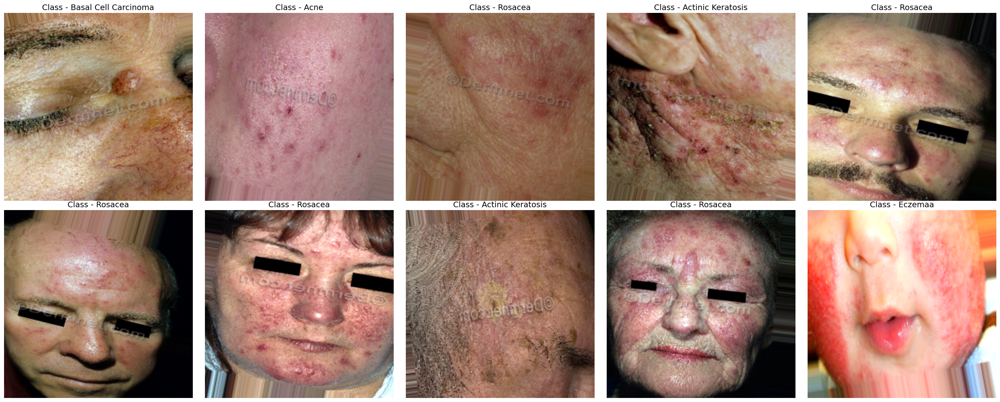

In [13]:
# Create batch generator for train-set, val-set, and test-set

img_height, img_width = 224, 224

train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.,
                                                                horizontal_flip=True,
                                                                rotation_range=15,
                                                                width_shift_range=0.1,
                                                                height_shift_range=0.1,
                                                                zoom_range=0.1,
                                                                shear_range=0.1,
                                                                brightness_range=[0.8, 1.3],
                                                                validation_split=0.2)

train_set = train_datagen.flow_from_directory(train_path,
                                              target_size=(img_height,img_width),
                                              class_mode='sparse',
                                              subset='training',
                                              batch_size=16,
                                              shuffle=True,
                                              seed=7)

val_set = train_datagen.flow_from_directory(train_path,
                                            target_size=(img_height,img_width),
                                            class_mode='sparse',
                                            subset='validation',
                                            batch_size=16,
                                            shuffle=True,
                                            seed=7)

test_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.)
test_set = test_datagen.flow_from_directory(test_path,
                                            target_size=(img_height,img_width),
                                            class_mode='sparse',
                                            batch_size=16,
                                            shuffle=False,
                                            seed=7)

# Ambil batch pertama dari train_set
images, labels = train_set[0]

# Ambil nama kelasnya
class_labels = list(train_set.class_indices.keys())

# Buat figure
fig, ax = plt.subplots(nrows=2, ncols=5, figsize=(25, 10))
n = 0

for i in range(2):
    for j in range(5):
        ax[i][j].imshow(images[n])
        label_idx = int(labels[n])
        ax[i][j].set_title(f"Class - {class_labels[label_idx]}", fontsize=14)
        ax[i][j].axis("off")
        n += 1

plt.tight_layout()
plt.show()


Teknik Augmentation yang dipakai pada model ini adalah:
1. rescale=1./255.: Normalisasi pixel dari rentang [0, 255] menjadi 0-1
2. horizontal_flip=True: Membalik gambar secara horizontal dari kiri ke kanan
3. rotation_range=15: Memutar gambar secara acak hingga 15 derajat
4. width_shift_range=0.1 dan height_shift_range=0.1: Menggeser gambar secara horizontal dan vertikal hingga 10% dari dimensi gambar
5. zoom_range=0.1: Memperbesar atau memperkecil gambar secara acak hingga 10%
6. shear_range=0.1: Menerapkan transformasi geser (shear) hingga 10%
7. brightness_range=[0.8, 1.3]: Mengubah kecerahan gambar antara 80% hingga 130% untuk membuat model lebih tahan terhadap kondisi pencahayaan yang berbeda
8. validation_split=0.2z: Membagi data menjadi 80% data latih dan 20% data validasi.

In [14]:
print("Train:", collections.Counter(train_set.classes))
print("Val:", collections.Counter(val_set.classes))
print("Test:", collections.Counter(test_set.classes))

Train: Counter({np.int32(0): 71, np.int32(1): 71, np.int32(2): 71, np.int32(3): 71, np.int32(4): 71})
Val: Counter({np.int32(0): 17, np.int32(1): 17, np.int32(2): 17, np.int32(3): 17, np.int32(4): 17})
Test: Counter({np.int32(0): 37, np.int32(1): 37, np.int32(2): 37, np.int32(3): 37, np.int32(4): 37})


maka dataset akan terbagi menjadi 3 jenis yaitu Train (untuk melatih model), Val (untuk mengevaluasi model selama pelatihan. tidak digunakan langsung untuk  melatih mode, tapi hanya untuk memeriksa  performa model pada data yang belum pernah dilihat selama pelatihan), dan Test (untuk mengevaluasi performa akhir model secara objektif). Dapat dilihat bahwa Train set terapat 71 gambar tiap kelas, Val terdapat 17 gambar tiap kelas yang didapatkan hasil split data Train, dan Test terdapat 37 gambar setiap kelas.

# 6. ANN Training (Sequential)

### 6.1 Model Definition

In [15]:
train_set.class_indices

{'Acne': 0,
 'Actinic Keratosis': 1,
 'Basal Cell Carcinoma': 2,
 'Eczemaa': 3,
 'Rosacea': 4}

ini untuk mendefiniskan label tiap kelas, label 0 untuk acne, label 1 untuk Actinic Keratosis, label 2 untuk  Basal Cell Carcinoma, label 3 untuk Eczema, dan label 4 untuk Rosacea

Sequential adalah tipe model paling sederhana dalam Keras. Sesuai namanya, model ini menyusun lapisan-lapisan (layers) secara berurutan dari input ke output, satu arah, satu jalur, tanpa percabangan atau koneksi silang.

Model Sequential di Keras memiliki keterbatasan karena hanya mendukung arsitektur linear satu arah, sehingga kurang fleksibel untuk struktur kompleks seperti skip connections, branching, atau multiple input-output. Di Model ini pun harus menyesuaikan parameter yang cocok, berapa banyak layer dll sehingga model ini tidak efisien karena butuh waktu yang lama menemukan kombinasi yang bagus

In [16]:
# Create Sequential API model
# Clear session

seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

model_sequential = Sequential()
model_sequential.add(Conv2D(256, (3,3), padding='same',activation='relu',strides=(1, 1), input_shape=(img_height, img_width,3)))
model_sequential.add(MaxPooling2D(2, 2))
model_sequential.add(Conv2D(256, (3,3),padding='same', activation='relu'))
model_sequential.add(MaxPooling2D(2, 2))
model_sequential.add(Conv2D(128, (3,3),padding='same',activation='relu',))
model_sequential.add(MaxPooling2D(2, 2))
model_sequential.add(Conv2D(64, (3,3),padding='same',activation='relu',))
model_sequential.add(MaxPooling2D(2, 2))
model_sequential.add(Conv2D(32, (3,3),padding='same',activation='relu',))
model_sequential.add(MaxPooling2D(2, 2))

model_sequential.add(Flatten())

model_sequential.add(Dropout(0.5))
model_sequential.add(Dense(128, activation='relu'))

model_sequential.add(Dropout(0.5))
model_sequential.add(Dense(64, activation='relu'))

model_sequential.add(Dense(5, activation='softmax'))

# Compile
model_sequential.compile(loss='sparse_categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])
model_sequential.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 224, 224, 256)  │         7,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 112, 112, 256)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 112, 112, 256)  │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 56, 56, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 56, 56, 128)    │       295,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 28, 28, 64)     │        73,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 14, 14, 32)     │        18,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 7, 7, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 1568)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1568)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       200,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 5)              │           325 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,193,957 (4.55 MB)

 Trainable params: 1,193,957 (4.55 MB)

 Non-trainable params: 0 (0.00 B)

Model ini terdiri dari:
1. 5 blok Conv2D + MaxPooling
2. 1 layer Flatten
3. 2 layer Dense tersembunyi (fully connected)
4. 1 output layer dengan menggunakan softmax karena multiclass (Dense dengan 5 unit karena hasil outputnya klasifikasi 5 kelas)
5. Dropout untuk regularisasi
6. Total Parameter: 1,193,957
7. Trainable: Semua (tidak ada layer yang di-freeze)

### 6.2 Model Training

Melatih model (model_sequential) menggunakan data pelatihan (train_set) selama 30 epoch (1 epoch = 1 kali model melihat seluruh data pelatihan). Kemudian memvalidasi performa model di setiap akhir epoch menggunakan data val_set (validation set). Hasil pelatihan (loss, accuracy, dll) disimpan ke dalam variabel history_seq.

In [17]:
history_seq = model_sequential.fit(train_set, epochs=30, validation_data=val_set)

Epoch 1/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 310s 13s/step - accuracy: 0.1852 - loss: 1.6291 - val_accuracy: 0.2000 - val_loss: 1.6100
Epoch 2/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 11s 458ms/step - accuracy: 0.2349 - loss: 1.6079 - val_accuracy: 0.2000 - val_loss: 1.6106
Epoch 3/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 21s 491ms/step - accuracy: 0.2080 - loss: 1.6107 - val_accuracy: 0.2000 - val_loss: 1.6092
Epoch 4/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 11s 493ms/step - accuracy: 0.1695 - loss: 1.6116 - val_accuracy: 0.2000 - val_loss: 1.6090
Epoch 5/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 11s 490ms/step - accuracy: 0.2359 - loss: 1.6039 - val_accuracy: 0.2471 - val_loss: 1.6040
Epoch 6/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 11s 473ms/step - accuracy: 0.2001 - loss: 1.6063 - val_accuracy: 0.2118 - val_loss: 1.5932
Epoch 7/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 21s 497ms/step - accuracy: 0.2294 - loss: 1.5636 - val_accuracy: 0.3059 - val_loss: 1.5488
Epoch 8/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 11s 487ms/step - accuracy: 0.2880 - loss: 1.4745 - val_accur

### 6.3 Model Evaluation

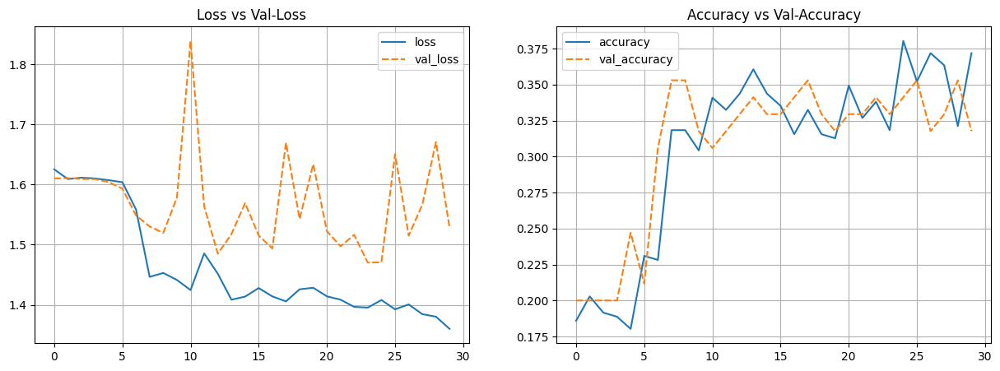

In [18]:
history_seq_df = pd.DataFrame(history_seq.history)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history_seq_df[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')

plt.subplot(1, 2, 2)
sns.lineplot(data=history_seq_df[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')
plt.show()

Dari hasil 30 epoch diatas adalah:
1. Training Accuracy Awal-awal sekitar 18-23%, meningkat sedikit ke 40% di akhir. Ini masih cukup rendah, menunjukkan model belum belajar dengan baik.
2. Validation Accuracy stagnan di sekitar 20-35%, artinya model juga belum generalisasi dengan baik ke data validasi.
3. Validation Loss tidak konsisten (kadang naik, kadang turun) bertanda model tidak generalisasi dengan baik.

Model masih underfitting, akurasinya rendah di train dan validation, artinya model perlu perbaikan baik dari sisi data maupun arsitektur dan trainingnya agar performa membaik.



Found 355 images belonging to 5 classes.
23/23 ━━━━━━━━━━━━━━━━━━━━ 10s 412ms/step


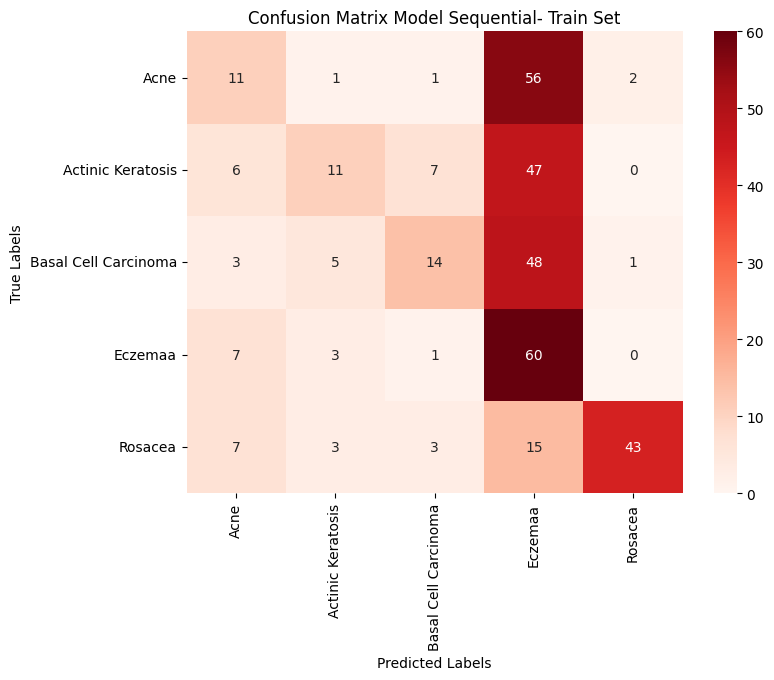

                      precision    recall  f1-score   support

                Acne       0.32      0.15      0.21        71
   Actinic Keratosis       0.48      0.15      0.23        71
Basal Cell Carcinoma       0.54      0.20      0.29        71
             Eczemaa       0.27      0.85      0.40        71
             Rosacea       0.93      0.61      0.74        71

            accuracy                           0.39       355
           macro avg       0.51      0.39      0.37       355
        weighted avg       0.51      0.39      0.37       355



In [19]:
# Buat ulang train_set untuk evaluasi
train_set_eval = train_datagen.flow_from_directory(train_path,
                                                   target_size=(img_height,img_width),
                                                   class_mode='sparse',
                                                   subset='training',
                                                   batch_size=16,
                                                   shuffle=False,
                                                   seed=7)

# Prediksi ulang
y_pred_prob_train_seq = model_sequential.predict(train_set_eval)
y_pred_class_train_seq = np.argmax(y_pred_prob_train_seq, axis=-1)

# True labels
y_true_train = train_set_eval.classes

# Confusion matrix
cm_train = confusion_matrix(y_true_train, y_pred_class_train_seq)

# Kelas
class_names = list(train_set.class_indices.keys())

# Plot
plt.figure(figsize=(8, 6))
sns.heatmap(cm_train, annot=True, fmt='d', cmap='Reds', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Model Sequential- Train Set')
plt.show()

# Classification report
print(classification_report(y_true_train, y_pred_class_train_seq, target_names=class_names))


Dari Confucion Matrix diatas  dapat dilihat bahwa model ini sangat baik dalam memprediksi Eczema (60 kasus diprediksi dengan benar) dan Rosacea (43 kasus) di train set.  Ini mengkonfirmasi bias yang kuat terhadap kelas Eczema.

Dari hasil Classification Report pada Train set pada Model Sequential:

1. Acne : Model gagal mengidentifikasi sebagian besar kasus sebenarnya dari kelas ini karena nilai recall yang rendah hanya  sebesar 15%.
2. Actinic Keratosis : Model gagal mengidentifikasi sebagian besar kasus sebenarnya dari kelas ini karena nilai recall yang rendah hanya  sebesar 15%.
3. Basal Cell Carcinoma	: Model gagal mengidentifikasi sebagian besar kasus sebenarnya dari kelas ini karena nilai recall yang rendah hanya  sebesar 15%.
4. Eczemaa : Nilai recall sangat tinggi yaitu 85% berarti model berhasil mengidentifikasi sebagian besar kasus Eczemaa yang sebenarnya. Meskipun model "menangkap" banyak Eczema, banyak juga yang diprediksi sebagai Eczema padahal bukan. Ini menunjukkan model sering melakukan False Positive untuk Eczema dikarenakan nilai precsion yang rendah hanya 27%.
5. Rosacea	:	Model sangat bagus untuk kelas ini karena precision tinggi artinya jika model memprediksi Rosacea, kemungkinan besar prediksinya benar. Ini adalah performa yang sangat baik dalam hal presisi. Model berhasil mengidentifikasi 61% dari kasus Rosacea yang sebenarnya.

Akurasi keseluruhan model di train set cukup rendah (39%), menunjukkan bahwa model masih kesulitan untuk mengklasifikasikan dengan benar secara keseluruhan.

In [20]:
# Check the performance of test-set

## Get the probability
y_pred_prob_seq = model_sequential.predict(test_set)

## Get class with maximum probability
y_pred_class_seq = np.argmax(y_pred_prob_seq, axis=-1)

12/12 ━━━━━━━━━━━━━━━━━━━━ 118s 11s/step


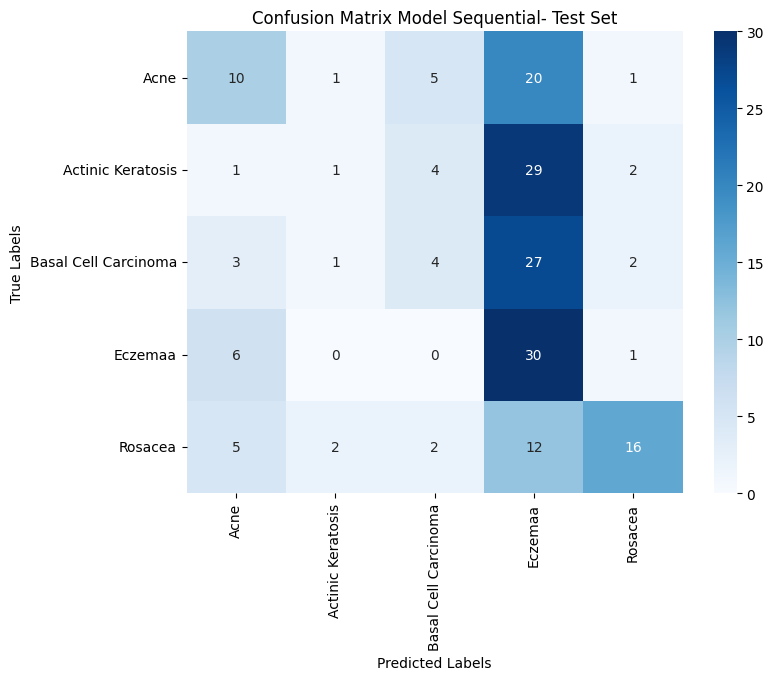

                      precision    recall  f1-score   support

                Acne       0.40      0.27      0.32        37
   Actinic Keratosis       0.20      0.03      0.05        37
Basal Cell Carcinoma       0.27      0.11      0.15        37
             Eczemaa       0.25      0.81      0.39        37
             Rosacea       0.73      0.43      0.54        37

            accuracy                           0.33       185
           macro avg       0.37      0.33      0.29       185
        weighted avg       0.37      0.33      0.29       185



In [21]:
# Hitung confusion matrix
cm = confusion_matrix(test_set.classes, y_pred_class_seq)

# Ambil label kelas dari train_set
class_names = np.array(list(train_set.class_indices.keys()))

# Tampilkan confusion matrix dalam bentuk heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Model Sequential- Test Set')
plt.show()

## Display Classification Report
print(classification_report(test_set.classes, y_pred_class_seq, target_names=np.array(list(train_set.class_indices.keys()))))

Dari Confusion Matrix diatas dapat dilihat bahwa model memiliki performa yang sangat baik dalam memprediksi Eczemaa (30 kasus diprediksi dengan benar) dan cukup baik untuk Rosacea (16 kasus). Namun, performanya kurang baik untuk Actinic Keratosis (hanya 1 kasus diprediksi benar). 

Model ini terlihat memiliki bias kuat untuk memprediksi Eczemaa. Banyak kelas lain (Acne, Actinic Keratosis, Basal Cell Carcinoma, Rosacea) sering salah diprediksi sebagai Eczemaa. Hal ini menunjukkan bahwa model mungkin terlalu berfokus pada fitur-fitur yang dominan pada Eczemaa


Dari hasil Classification  Report pada Test set pada Model Sequential:
1. Acne : Recall dan Precision sedikit meningkat dibandingkan train set, menghasilkan F1-score yang juga sedikit lebih baik (0.32).
2. Actinic Keratosis	:	Model hampir tidak pernah berhasil mengidentifikasi kasus Actinic Keratosis yang sebenarnya di test set hanya 3%
3. Basal Cell Carcinoma	:	Model hampir tidak pernah berhasil mengidentifikasi kasus Actinic Keratosis yang sebenarnya di test set hanya 11%
4. Eczemaa	:	Konsisten dengan train set, model masih sangat baik dalam mengidentifikasi Eczemaa yang sebenarnya di test set. Model masih sering salah memprediksi kelas lain sebagai Eczemaa.
5. Rosacea	:	Meskipun sedikit menurun dari train set, model masih cukup akurat saat memprediksi Rosacea.

Karena pada dataset ini setiap kelas sudah memiliki data yang sama atau seimbang, maka metrik akurasi yang akan dibandingkan. maka dapat dilihat bahwa akurasi keseluruhan model sequential di test set lebih rendah dari train set 33% dengan 39% mengindikasi bahwa  model ini **underfitting**

# 7. ANN Improvement
Model DenseNet121

Karakteristik:
  * Setiap layer terkoneksi langsung ke semua layer sebelumnya (dense connectivity). Ini membuat model menggabungkan fitur-fitur dari berbagai tingkat kedalaman, jadi sangat bagus dalam mengenali pola dari data yang tidak terlalu "jelas" atau beragam.
  * DenseNet punya parameter lebih sedikit dibanding ResNet atau VGG dengan performa yang serupa atau lebih baik, tidak overfit terlalu cepat, dan cepat belajar, bahkan dari dataset yang ukurannya sedang/kecil
  * Menangkap detail kecil pada citra dan mampu memahami relasi antar fitur lebih baik

Sehingga saya merasa model ini paling cocok digunakan sebagai model improvement untuk mengklasifikasikan penyakit kulit pada wajah karena terdapat fitur reuse (dense connectivity) yang sangat cocok  dengan dataset kecil  tapi kompleks seperti projek ini. dan juga model ini sangat detail dalam menangkap detail kecil pada gambar yang sangat cocok untuk klasifikasi penyakit kulit wajah yang beda tipis antar kelasnya.


### 7.1 Model Definition

In [22]:
seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

imp_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
imp_model.trainable = False

# Custom top layers
x = imp_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.4)(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.4)(x)
outputs = Dense(5, activation='softmax')(x)

# Final model
model = Model(inputs=imp_model.input, outputs=outputs)

model.compile(loss='sparse_categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])
model.summary()

29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 7,694,917 (29.35 MB)

 Trainable params: 657,413 (2.51 MB)

 Non-trainable params: 7,037,504 (26.85 MB)

### 7.2 Model Training

Melatih model Transfer Learning (model DenseNet121) menggunakan data pelatihan (train_set) selama 30 epoch (1 epoch = 1 kali model melihat seluruh data pelatihan). Kemudian memvalidasi performa model di setiap akhir epoch menggunakan data val_set (validation set). Hasil pelatihan (loss, accuracy, dll) disimpan ke dalam variabel history_dense

In [23]:
history_dense = model.fit(train_set, epochs=30, validation_data=val_set)

Epoch 1/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 105s 3s/step - accuracy: 0.2931 - loss: 1.9305 - val_accuracy: 0.3647 - val_loss: 1.4815
Epoch 2/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 65s 497ms/step - accuracy: 0.4462 - loss: 1.5061 - val_accuracy: 0.5647 - val_loss: 1.4041
Epoch 3/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 22s 563ms/step - accuracy: 0.5283 - loss: 1.1877 - val_accuracy: 0.5176 - val_loss: 1.3197
Epoch 4/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 13s 563ms/step - accuracy: 0.5550 - loss: 1.0981 - val_accuracy: 0.5647 - val_loss: 1.2666
Epoch 5/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 10s 454ms/step - accuracy: 0.6599 - loss: 0.9251 - val_accuracy: 0.5882 - val_loss: 1.1908
Epoch 6/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 10s 441ms/step - accuracy: 0.6875 - loss: 0.8310 - val_accuracy: 0.5294 - val_loss: 1.1769
Epoch 7/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 11s 477ms/step - accuracy: 0.6587 - loss: 0.9940 - val_accuracy: 0.5765 - val_loss: 1.1696
Epoch 8/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 11s 477ms/step - accuracy: 0.7162 - loss: 0.7602 - val_accura

### 7.3 Model Evaluation

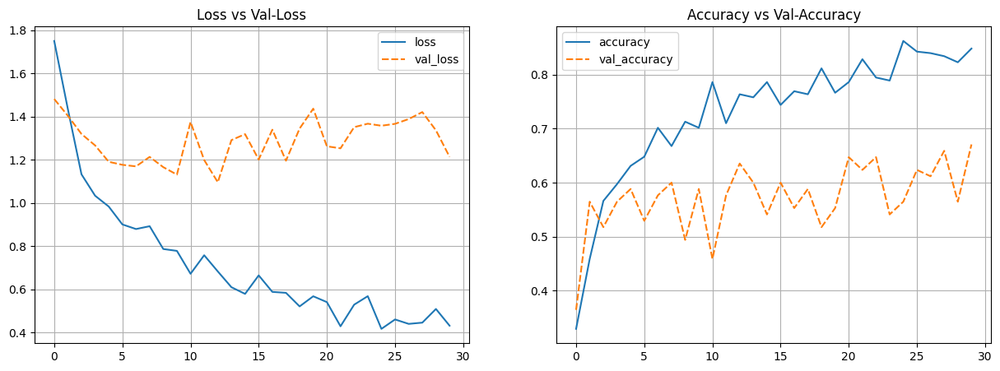

In [24]:
history_dense_df = pd.DataFrame(history_dense.history)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history_dense_df[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')

plt.subplot(1, 2, 2)
sns.lineplot(data=history_dense_df[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')
plt.show()

Dari hasil 30 epoch diatas adalah:
1. Training Accuracy naik  sangat tinggi dari 20% ke 80% artinya model sangat  baik dalam belajar dan menghafal pola-pola dari data yang digunakan untuk melatihnya.
2. Validation Accuracy stagnan di sekitar 60% - 67%, validation accuracy tidak menunjukkan peningkatan yang signifikan dan tidak mengikuti tren yang sama.
3. Validation Loss tidak konsisten kadang naik dan kadang turun bertanda model tidak generalisasi dengan baik.

Maka artinya  model ini Overfitting karena model belajar terlalu baik di data latih, tapi tidak generalisasi dengan baik ke data validasi.

Found 355 images belonging to 5 classes.
23/23 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step


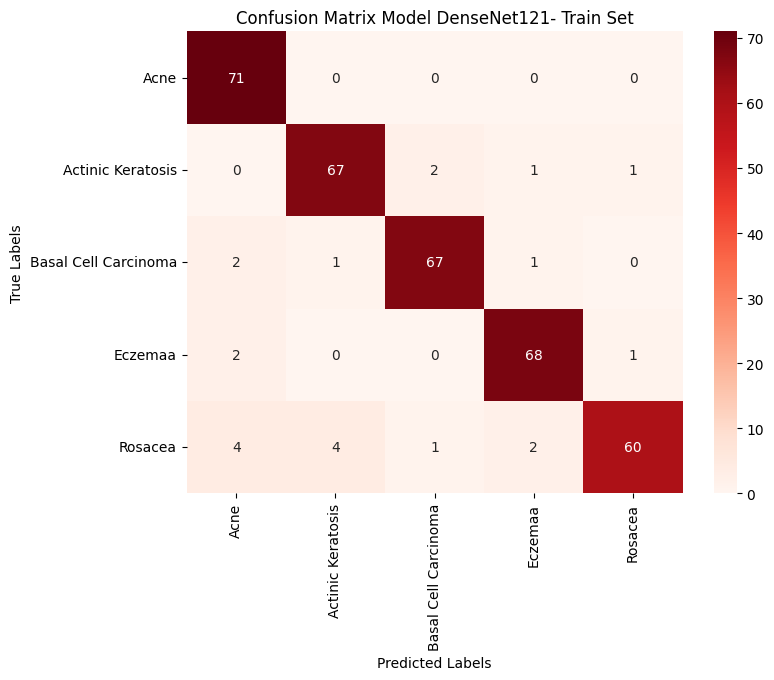

                      precision    recall  f1-score   support

                Acne       0.90      1.00      0.95        71
   Actinic Keratosis       0.93      0.94      0.94        71
Basal Cell Carcinoma       0.96      0.94      0.95        71
             Eczemaa       0.94      0.96      0.95        71
             Rosacea       0.97      0.85      0.90        71

            accuracy                           0.94       355
           macro avg       0.94      0.94      0.94       355
        weighted avg       0.94      0.94      0.94       355



In [25]:
# Buat ulang train_set untuk evaluasi
train_set_eval = train_datagen.flow_from_directory(train_path,
                                                   target_size=(img_height,img_width),
                                                   class_mode='sparse',
                                                   subset='training',
                                                   batch_size=16,
                                                   shuffle=False,
                                                   seed=7)

# Prediksi ulang
y_pred_prob_train = model.predict(train_set_eval)
y_pred_class_train = np.argmax(y_pred_prob_train, axis=-1)

# True labels
y_true_train = train_set_eval.classes

# Confusion matrix
cm_train = confusion_matrix(y_true_train, y_pred_class_train)

# Kelas
class_names = list(train_set.class_indices.keys())

# Plot
plt.figure(figsize=(8, 6))
sns.heatmap(cm_train, annot=True, fmt='d', cmap='Reds', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Model DenseNet121- Train Set')
plt.show()

# Classification report
print(classification_report(y_true_train, y_pred_class_train, target_names=class_names))


Dari Confusion Matrix diatas dapat dilihat bahwa Angka-angka di diagonal sangat tinggi dan mendekati jumlah total sampel per kelas. Ini menunjukkan bahwa model sangat, sangat baik dalam mengklasifikasikan data pelatihan dengan benar. Model hampir sempurna dalam mengenali setiap kelas di train set.

Dari hasil Classification Report pada Train set pada Model DenseNet121:
1. Acne	: Memiliki recall sempurna (1.00), artinya model berhasil mengidentifikasi semua kasus Acne yang sebenarnya di data latih. Precisionnya juga sangat tinggi (0.90).
2. Actinic Keratosis	:	Recall, Precision, dan f1-score memiliki  nilai yang sangat  tinggi dan seimbang  artinya model hampir sempurna mengidentifikasi semua  kasus Keratosis
3. Basal Cell Carcinoma	:	Recall, Precision, dan f1-score memiliki  nilai yang sangat  tinggi dan seimbang  artinya model hampir sempurna mengidentifikasi semua  kasus Basal Cell Carcinoma
4. Eczemaa	:	Sangat baik karena nilai precision, recall, dan f1-score seimbang.
5. Rosacea	:	Memiliki precision sangat tinggi (0.97), artinya jika model memprediksi Rosacea, kemungkinan besar itu benar. Meskipun recall (0.85) sedikit lebih rendah dari kelas lain, ini masih sangat baik.

Model DenseNet121 menunjukkan performa yang luar biasa pada train set dengan accuracy keseluruhan mencapai 94%.

In [26]:
# Check the performance of test-set

## Get the probability
y_pred_prob_dense = model.predict(test_set)

## Get class with maximum probability
y_pred_class_dense = np.argmax(y_pred_prob_dense, axis=-1)

12/12 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step


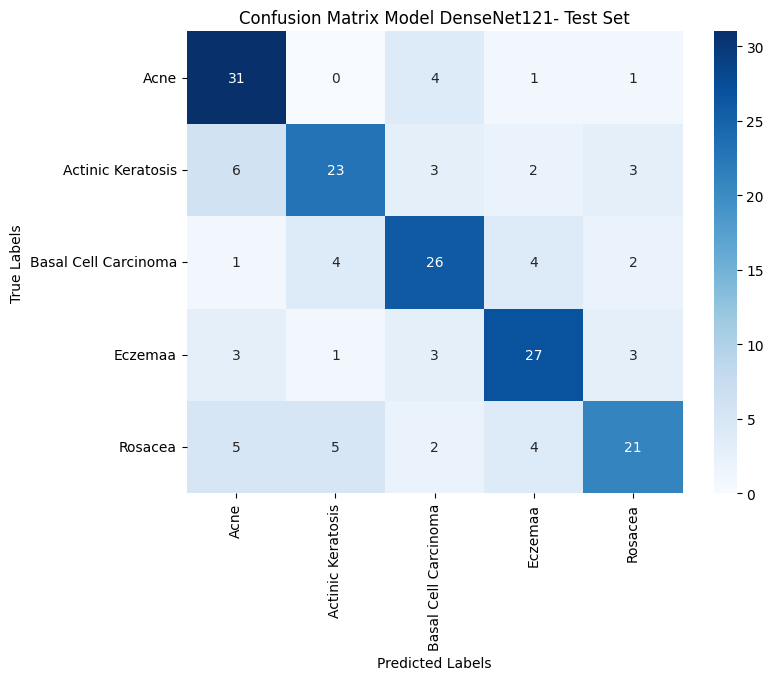

                      precision    recall  f1-score   support

                Acne       0.67      0.84      0.75        37
   Actinic Keratosis       0.70      0.62      0.66        37
Basal Cell Carcinoma       0.68      0.70      0.69        37
             Eczemaa       0.71      0.73      0.72        37
             Rosacea       0.70      0.57      0.63        37

            accuracy                           0.69       185
           macro avg       0.69      0.69      0.69       185
        weighted avg       0.69      0.69      0.69       185



In [27]:
# Hitung confusion matrix
cm_dense = confusion_matrix(test_set.classes, y_pred_class_dense)

# Ambil label kelas dari train_set
class_names = np.array(list(train_set.class_indices.keys()))

# Tampilkan confusion matrix dalam bentuk heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm_dense, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Model DenseNet121- Test Set')
plt.show()

## Display Classification Report
print(classification_report(test_set.classes, y_pred_class_dense, target_names=np.array(list(train_set.class_indices.keys()))))

Dari Confusion Matrix diatas dapat dilihat bahwa angka-angka di diagonal untuk test set lebih rendah dibandingkan dengan train set. angka-angka di luar diagonal jauh lebih signifikan dibandingkan di train set. Ini menunjukkan banyak kesalahan prediksi.

Dari hasil Classification Report pada Train set pada Model DenseNet121:
1. Acne	: Recall cukup baik (0.84), namun precision (0.67) menunjukkan bahwa ada kasus non-Acne yang salah diprediksi sebagai Acne.
2. Actinic Keratosis	:	Precision (0.70) lebih tinggi dari recall (0.62), menunjukkan model lebih sering benar ketika memprediksi Actinic Keratosis, tetapi sering melewatkan kasus Actinic Keratosis yang sebenarnya. mengidentifikasi semua  kasus Keratosis
3. Basal Cell Carcinoma	:	Menunjukkan keseimbangan yang cukup baik antara precision dan recall
4. Eczemaa	:	Menunjukkan keseimbangan yang cukup baik antara precision dan recall
5. Rosacea	:	Precision (0.70) lebih baik daripada recall (0.57), dan recallnya adalah yang terendah di antara semua kelas pada test set. Ini berarti model sering gagal mengidentifikasi kasus Rosacea yang sebenarnya pada data uji

Karena pada dataset ini setiap kelas sudah memiliki data yang sama atau seimbang, maka metrik akurasi yang akan dibandingkan. maka dapat dilihat bahwa performa model menurun secara signifikan pada test set dibandingkan dengan train set. Akurasi keseluruhan turun menjadi 69% menandakan bahwa model ini **overfitting**

# 8. Model Saving
Model saving dalam deep learning (termasuk deep learning) digunakan untuk menyimpan model yang sudah dilatih agar bisa digunakan kembali nanti tanpa perlu melatih ulang dari awal. Dari hasil evaluasi 2 model diatas, Model DenseNet121 adalah pilihan yang lebih baik dibandingkan Model Sequential karena akurasi keseluruhan pada test set yang lebih tinggi

In [28]:
model.save('model.keras')

# 9. Model Inference
tahapan di mana model deep learning yang telah dilatih dan divalidasi, digunakan untuk membuat prediksi atau keputusan pada data baru yang belum pernah dilihat sebelumnya.

# 10. Kesimpulan & Rekomendasi
Model DenseNet121 menunjukkan performa yang secara signifikan lebih baik dibandingkan model Sequential. Dapat  dilihat dari perbandinga Accuracy. Pada Train set, DenseNet121 mencapai sekitar 94%, menunjukkan kemampuan belajar yang sangat tinggi pada data latih, jauh melampaui model Sequential (sekitar 39%). sedangkan di Test set, DenseNet121 mencapai sekitar 69%, sementara model Sequential hanya mencapai sekitar 33%. Meskipun kedua model menunjukkan tanda-tanda ketidaksempurnaan dalam generalisasi, DenseNet121 mampu mencapai akurasi generalisasi yang jauh lebih tinggi pada data yang belum pernah dilihat sebelumnya

Rekomendasi :
1. Mengumpulkan lebih banyak data dari sumber lain, atau data serupa untuk memperbesar variasi data latih. Data lebih banyak akan membantu model belajar pola dengan lebih baik dan mengurangi overfitting.
2. Menerapkan augmentasi yang lebih kompleks seperti CutMix, Mixup, atau AutoAugment agar model lebih tahan terhadap variasi data.
3. Eksplorasi Arsitektur yang Lebih Efisien jika DenseNet121 terlalu berat untuk dataset kecil, coba arsitektur yang lebih ringan dan lebih cocok